In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import _init_paths

import logging
import os
import os.path as osp
from opts import opts
from tracking_utils.utils import mkdir_if_missing
from tracking_utils.log import logger
import datasets.dataset.jde as datasets
from track import eval_seq
import time

import _init_paths
import cv2
import logging
import argparse
import motmetrics as mm
import numpy as np
import torch

from tracker.multitracker import JDETracker
from tracking_utils import visualization as vis
from tracking_utils.log import logger
from tracking_utils.timer import Timer
from tracking_utils.evaluation import Evaluator
import datasets.dataset.jde as datasets

from tracking_utils.utils import mkdir_if_missing


import torch.nn.functional as F

from models.model import create_model, load_model
from models.decode import mot_decode
from tracking_utils.utils import *
from tracking_utils.log import logger
from tracking_utils.kalman_filter import KalmanFilter
from models import *
from tracker import matching
import sys
sys.path.append('/root/FairMOT/src/lib/tracker')
from basetrack import BaseTrack, TrackState
from utils.post_process import ctdet_post_process
from utils.image import get_affine_transform
from models.utils import _tranpose_and_gather_feat
from sklearn import metrics
from PIL import Image
from copy import deepcopy

In [2]:
cmd =  'mot --load_model /data/models/mot/fairmot/crowdhuman_dla34/model_66.pth --conf_thres 0.4 --K 100 --input-video /data/models/mot/test/Paris_crop.mp4 --output-root /data/models/mot/test/'
opt = opts().init(args=cmd.split())

Fix size testing.
training chunk_sizes: [6, 6]
The output will be saved to  /data/models/mot/fairmot/default
heads {'head_hm': 1, 'head_wh': 4, 'full_hm': 1, 'full_wh': 4, 'id': 128, 'head_reg': 2, 'full_reg': 2}


In [3]:
dataloader = datasets.LoadVideo(opt.input_video, opt.img_size)
frame_rate = dataloader.frame_rate

Lenth of the video: 12480 frames


In [4]:
tracker = JDETracker(opt, frame_rate=frame_rate)
timer = Timer()
results = []
frame_id = 0

Creating model...
trying to load in /data/models/mot/fairmot/crowdhuman_dla34/model_66.pth, epoch 66
load complete successfully!


In [5]:
iterer = iter(dataloader)

In [7]:
for _ in range(150):
    path, img, img0 = next(iterer)
    im_blob = torch.from_numpy(img).cuda().unsqueeze(0)
    frame_id +=1

In [13]:
path, img, img0 = next(iterer)
im_blob = torch.from_numpy(img).cuda().unsqueeze(0)
frame_id +=1

In [14]:
activated_starcks = []
refind_stracks = []
lost_stracks = []
removed_stracks = []

width = img0.shape[1]
height = img0.shape[0]
inp_height = im_blob.shape[2]
inp_width = im_blob.shape[3]
c = np.array([width / 2., height / 2.], dtype=np.float32)
s = max(float(inp_width) / float(inp_height) * height, width) * 1.0
meta = {'c': c, 's': s,
        'out_height': inp_height // tracker.opt.down_ratio,
        'out_width': inp_width // tracker.opt.down_ratio}

''' Step 1: Network forward, get detections & embeddings'''
with torch.no_grad():
    output = tracker.model(im_blob)[-1]
    head_hm = output['head_hm'].sigmoid_()
    head_wh = output['head_wh']
    full_hm = output['full_hm'].sigmoid_()
    full_wh = output['full_wh']
    head_reg = output['head_reg'] if tracker.opt.reg_offset else None
    full_reg = output['full_reg'] if tracker.opt.reg_offset else None

    id_feature = output['id']
    id_feature = F.normalize(id_feature, dim=1)

    # print(f'hm shape : {head_hm.shape}')
    # print(f'wh shape : {head_wh.shape}')
    # print(f'reg shape : {head_reg.shape}')

    # head_dets, _ = mot_decode(head_hm, head_wh, reg=head_reg, ltrb=self.opt.ltrb, K=self.opt.K)
    head_dets, _ = mot_decode(head_hm, head_wh, reg=head_reg, ltrb=tracker.opt.ltrb, K= tracker.opt.K)
    full_dets, full_inds = mot_decode(full_hm, full_wh, reg=full_reg, ltrb=tracker.opt.ltrb, K= tracker.opt.K)
    # full_dets, full_inds = mot_decode(full_hm, full_wh, reg=full_reg, ltrb=self.opt.ltrb, K=self.opt.K)
    id_feature = _tranpose_and_gather_feat(id_feature, full_inds)
    id_feature = id_feature.squeeze(0)
    id_feature = id_feature.cpu().numpy()
# print(f'head_dets shape : {head_dets.shape}')


head_dets = tracker.post_process(head_dets, meta)[1]
full_dets = tracker.post_process(full_dets, meta)[1]

In [8]:
# img0_h = deepcopy(cv2.cvtColor(img0, cv2.COLOR_BGR2RGB))
# img0_f = deepcopy(cv2.cvtColor(img0, cv2.COLOR_BGR2RGB))
# line_thickness = max(1, int(img0.shape[1] / 500.))

# for ltrb in head_dets:
#     ltrb = tuple(map(int, ltrb))
#     color = np.random.randint(0, 255, 3)
#     color = tuple(map(int, color))
#     cv2.rectangle(img0_h, ltrb[0:2], ltrb[2:4], color=color, thickness=line_thickness)

# for ltrb in full_dets:
#     ltrb = tuple(map(int, ltrb))
#     color = np.random.randint(0, 255, 3)
#     color = tuple(map(int, color))
#     cv2.rectangle(img0_f, ltrb[0:2], ltrb[2:4], color=color, thickness=line_thickness)

- conf filtering

In [15]:
remain_inds = head_dets[:, 4] > tracker.opt.conf_thres
head_dets = head_dets[remain_inds]

remain_inds = full_dets[:, 4] > tracker.opt.conf_thres
full_dets = full_dets[remain_inds]
id_feature = id_feature[remain_inds]

In [16]:
img0_h = deepcopy(cv2.cvtColor(img0, cv2.COLOR_BGR2RGB))
img0_f = deepcopy(cv2.cvtColor(img0, cv2.COLOR_BGR2RGB))
line_thickness = max(1, int(img0.shape[1] / 500.))
text_scale = max(1, img0.shape[1] / 1600.)
text_thickness = 2

for idx, ltrb in enumerate(head_dets):
    ltrb = tuple(map(int, ltrb))
    color = np.random.randint(0, 255, 3)
    color = tuple(map(int, color))
    cv2.rectangle(img0_h, ltrb[0:2], ltrb[2:4], color=color, thickness=line_thickness)   
    cv2.putText(img0_h, '{}'.format(idx), (ltrb[0], ltrb[1] + 30), cv2.FONT_HERSHEY_PLAIN, text_scale, (255, 0, 0),
                    thickness=text_thickness)

for idx, ltrb in enumerate(full_dets):
    ltrb = tuple(map(int, ltrb))
    color = np.random.randint(0, 255, 3)
    color = tuple(map(int, color))
    cv2.rectangle(img0_f, ltrb[0:2], ltrb[2:4], color=color, thickness=line_thickness)
    cv2.putText(img0_f, '{}'.format(idx), (ltrb[0], ltrb[1] + 30), cv2.FONT_HERSHEY_PLAIN, text_scale, (255, 0, 0),
                    thickness=text_thickness)

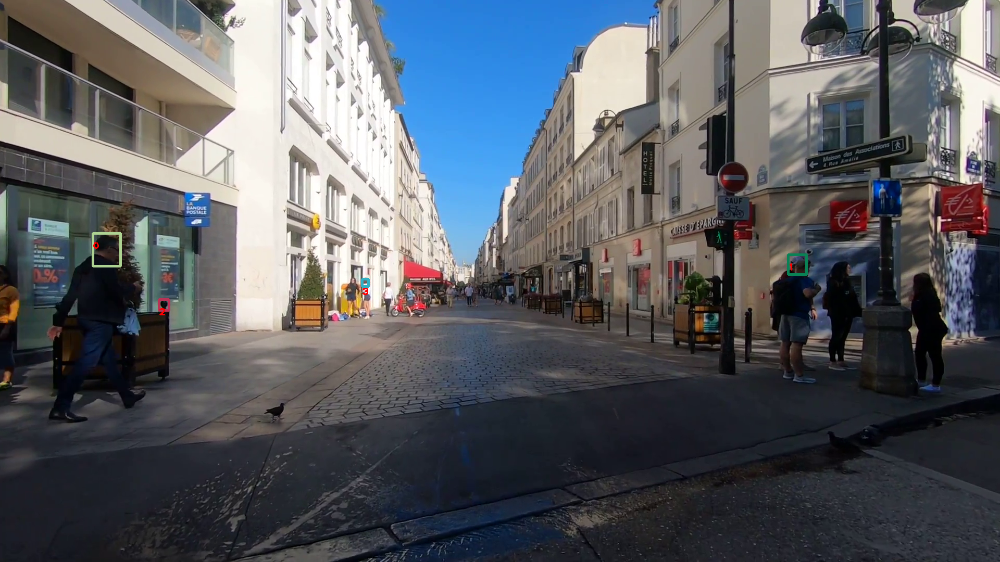

In [17]:
Image.fromarray(img0_h)

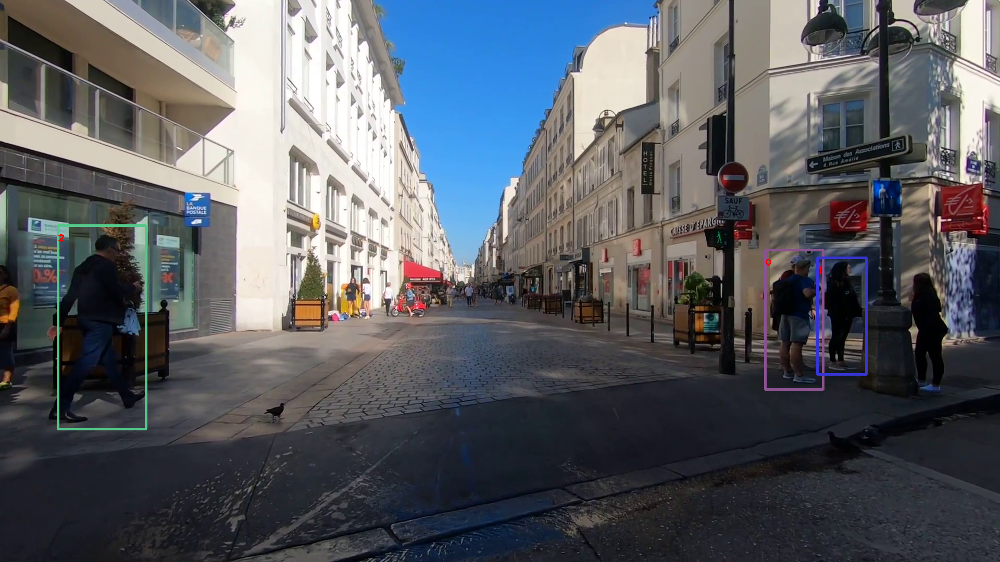

In [18]:
Image.fromarray(img0_f)

- alignment

In [19]:
if len(head_dets) > 0 and len(full_dets) > 0:

    iou_mat = matching.ious(full_dets, head_dets)

    # iou_mat = iou_mat / (np.linalg.norm(iou_mat, axis=1) + 10e-4)
#     ed_iou_mat = ed_minus * iou_mat

    max_value_axis1 = np.max(iou_mat, axis=1)
    over_zero_idx = np.where(max_value_axis1 >0, True, False)
    full_dets_over_zero = full_dets[over_zero_idx]
    id_feature = id_feature[over_zero_idx]

    max_value_axis0 = np.max(iou_mat, axis=0)
    over_zero_idx = np.where(max_value_axis0 >0, True, False)
    head_dets_over_zero = head_dets[over_zero_idx]
    #


#     else:
#         dets = []

else:
    dets = []

In [20]:
img0_h = deepcopy(cv2.cvtColor(img0, cv2.COLOR_BGR2RGB))
img0_f = deepcopy(cv2.cvtColor(img0, cv2.COLOR_BGR2RGB))
line_thickness = max(1, int(img0.shape[1] / 500.))
text_scale = max(1, img0.shape[1] / 1600.)
text_thickness = 2

for idx, ltrb in enumerate(head_dets_over_zero):
    ltrb = tuple(map(int, ltrb))
    color = np.random.randint(0, 255, 3)
    color = tuple(map(int, color))
    cv2.rectangle(img0_h, ltrb[0:2], ltrb[2:4], color=color, thickness=line_thickness)   
    cv2.putText(img0_h, '{}'.format(idx), (ltrb[0], ltrb[1] + 30), cv2.FONT_HERSHEY_PLAIN, text_scale, (255, 0, 0),
                    thickness=text_thickness)

for idx, ltrb in enumerate(full_dets_over_zero):
    ltrb = tuple(map(int, ltrb))
    color = np.random.randint(0, 255, 3)
    color = tuple(map(int, color))
    cv2.rectangle(img0_f, ltrb[0:2], ltrb[2:4], color=color, thickness=line_thickness)
    cv2.putText(img0_f, '{}'.format(idx), (ltrb[0], ltrb[1] + 30), cv2.FONT_HERSHEY_PLAIN, text_scale, (255, 0, 0),
                    thickness=text_thickness)

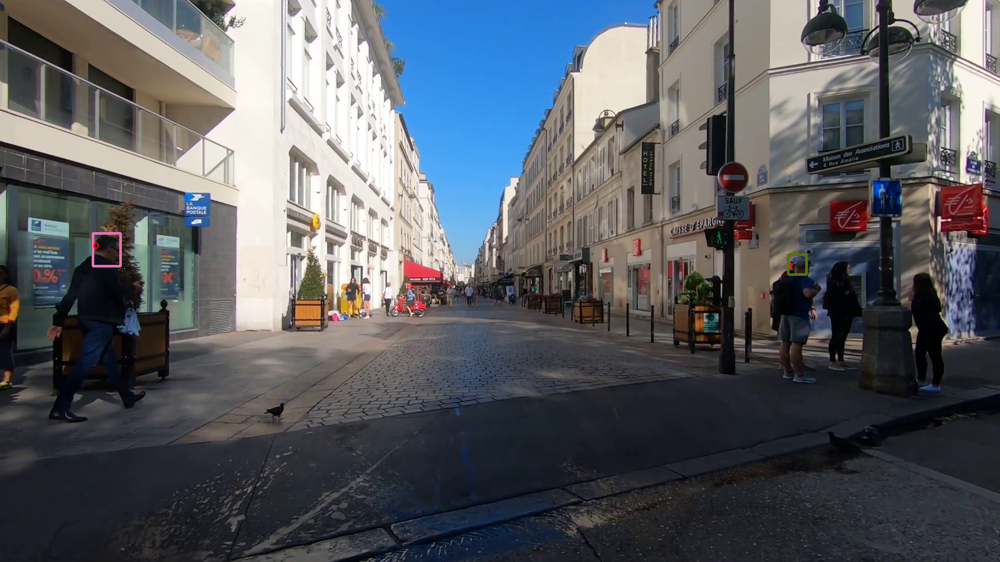

In [21]:
Image.fromarray(img0_h)

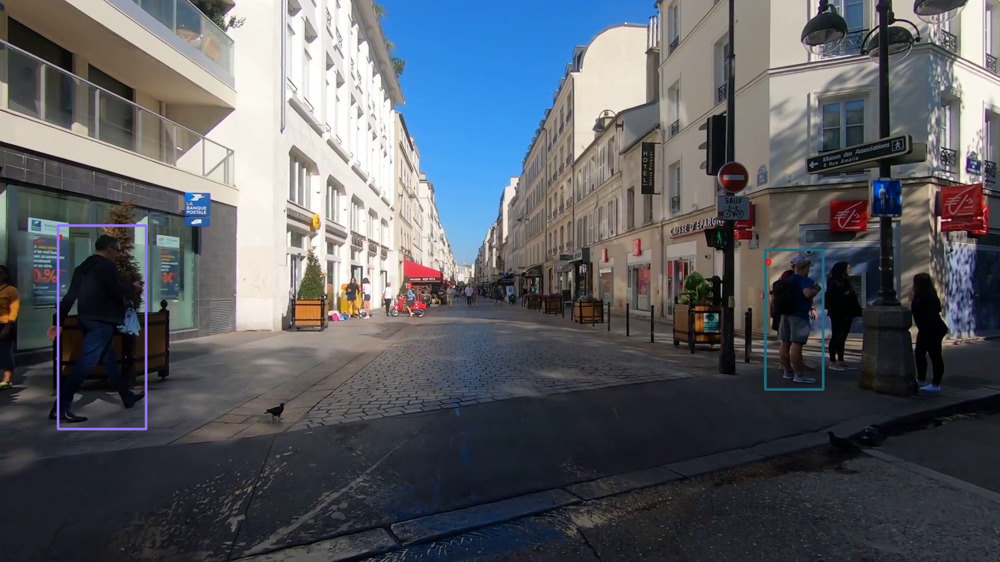

In [22]:
Image.fromarray(img0_f)

In [23]:
if len(head_dets_over_zero) > 0 and len(full_dets_over_zero) > 0:

    full_xyt = tracker.get_xyt(full_dets_over_zero)
    head_xyt = tracker.get_xyt(head_dets_over_zero)
    ed_mat = metrics.pairwise.euclidean_distances(full_xyt, head_xyt) # only compute distances btw left top point
    ed_minus = 1 - ed_mat / np.sqrt(width**2 + height**2)

    iou_res2 = matching.ious(full_dets_over_zero, head_dets_over_zero)
    iou_filtered = np.where(iou_res2 > 0 , 1, 0)
    ed_iou_mat = ed_minus * iou_filtered

    argmax = np.argmax(ed_iou_mat, axis=1)
    #
    sorted_head_dets = head_dets_over_zero[argmax]
    iou_res3 = matching.ious(full_dets_over_zero, sorted_head_dets )


    # dets = self.merge_outputs([dets])[1]
    # dets = self.merge_outputs_both(full_dets, head_dets)
    dets = tracker.merge_outputs_both(full_dets_over_zero, sorted_head_dets)

In [24]:
img0_merge = deepcopy(cv2.cvtColor(img0, cv2.COLOR_BGR2RGB))
line_thickness = max(1, int(img0.shape[1] / 500.))

for ltrb in dets:
    ltrb = tuple(map(int, ltrb))
    color = np.random.randint(0, 255, 3)
    color = tuple(map(int, color))
    
    full_ltrb = ltrb[:4]
    head_ltrb = ltrb[5:9]
    cv2.rectangle(img0_merge, full_ltrb[0:2], full_ltrb[2:4], color=color, thickness=line_thickness)
    cv2.rectangle(img0_merge, head_ltrb[0:2], head_ltrb[2:4], color=color, thickness=line_thickness)

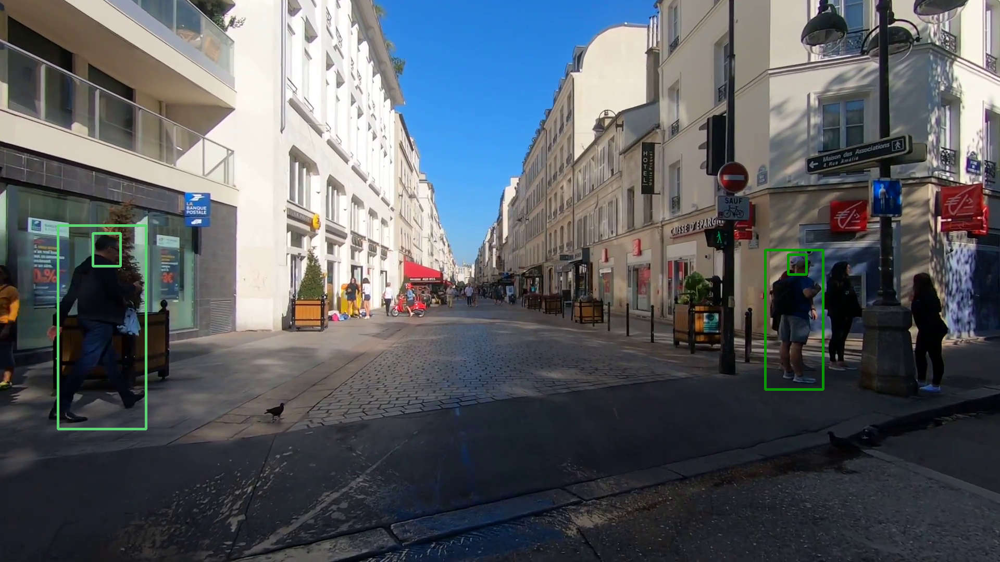

In [25]:
Image.fromarray(img0_merge)